In [50]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import folium
%matplotlib inline

In [51]:
os.chdir(r'C:\Users\kojaejeung\Desktop\데이터시각화프로젝트\data')

In [52]:
case_data = pd.read_csv('Case.csv')
case_data.head()

,case_id,province,city,group,infection_case,confirmed,latitude,longitude
0,1000001,Seoul,Yongsan-gu,True,Itaewon Clubs,133.0,37.538621,126.992652
1,1000002,Seoul,Guro-gu,True,Guro-gu Call Center,99.0,37.508163,126.884387
2,1000003,Seoul,Dongdaemun-gu,True,Dongan Church,20.0,37.592888,127.056766
3,1000004,Seoul,Guro-gu,True,Manmin Central Church,41.0,37.481059,126.894343
4,1000005,Seoul,Eunpyeong-gu,True,Eunpyeong St. Mary's Hospital,14.0,37.63369,126.9165


In [53]:
case_data.shape

(128, 8)

In [54]:
case_data.isnull().sum()

case_id           0
province          0
city              0
group             0
infection_case    0
confirmed         3
latitude          0
longitude         0
dtype: int64

In [55]:
# 결측치 nan 값의 열 제거
case_data['confirmed'].unique()
case_data = case_data.dropna(axis=0)
case_data.isnull().sum()

case_id           0
province          0
city              0
group             0
infection_case    0
confirmed         0
latitude          0
longitude         0
dtype: int64

In [56]:
infection_case_confirmed = case_data[['infection_case','confirmed']]
infection_case_confirmed

,infection_case,confirmed
0,Itaewon Clubs,133.0
1,Guro-gu Call Center,99.0
2,Dongan Church,20.0
3,Manmin Central Church,41.0
4,Eunpyeong St. Mary's Hospital,14.0
...,...,...
123,etc,19.0
124,overseas inflow,10.0
125,contact with patient,0.0
126,etc,4.0


In [57]:
# infection_case에 중복되는 값이 있는것 같아 보이니.. groupby를 해줘야 할거 같다.
len(infection_case_confirmed['infection_case'].unique())

48

In [58]:
# infection_case로 그룹을 묶고, confirmed column에 합계를 보여준후, sort_values(ascending=False)를 사용해서 내림차순 정렬해줘
# ascending=True default값 오름차순정렬
infection_case_sorted = infection_case_confirmed.groupby('infection_case')['confirmed'].sum().sort_values(ascending=False)
infection_case_sorted = infection_case_sorted.reset_index()
infection_case_sorted

,infection_case,confirmed
0,Shincheonji Church,5212.0
1,contact with patient,1236.0
2,etc,1068.0
3,overseas inflow,886.0
4,Itaewon Clubs,253.0
5,Second Mi-Ju Hospital,196.0
6,Guro-gu Call Center,167.0
7,Hansarang Convalescent Hospital,128.0
8,Cheongdo Daenam Hospital,123.0
9,Coupang Logistics Center,109.0


# Infection Case By Confirmed 전체데이터 사용

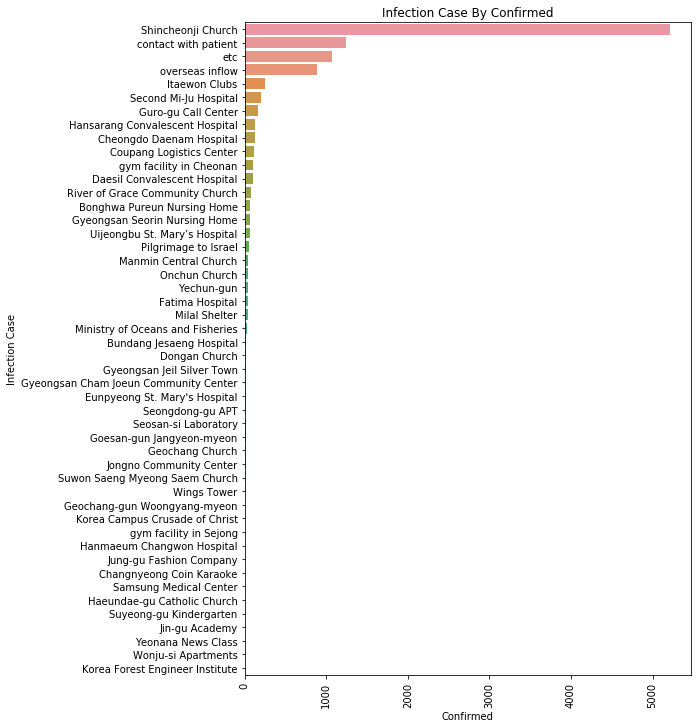

In [59]:
# 전체 데이터 시각화.
plt.figure(figsize=(8,12))
sns.barplot(data=infection_case_sorted, x='confirmed',y='infection_case')
plt.xticks(rotation=90)
plt.xlabel('Confirmed')
plt.ylabel('Infection Case')
plt.title('Infection Case By Confirmed')
plt.show()

# Infection Case By Confirmed Top 10

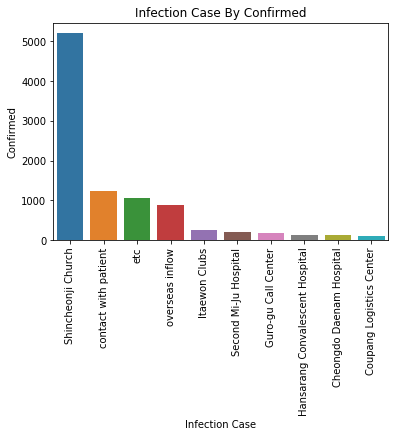

In [60]:
# 시각화를 해주었으나 밑에 의미없는 수치들이 많은 것 같으니 대략 top10개 정도를 제외하고 시각화 해주자
# plt.figure(figsize=(6,6))
sns.barplot(data=infection_case_sorted[:10], x='infection_case',y='confirmed')
plt.xticks(rotation=90)
plt.xlabel('Infection Case')
plt.ylabel('Confirmed')
plt.title('Infection Case By Confirmed')
plt.show()

# TimeAge.csv 데이터 불러오기.

In [61]:
time_age = pd.read_csv('TimeAge.csv')
time_age.info()
time_age.nunique()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 819 entries, 0 to 818
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   date       819 non-null    object
 1   time       819 non-null    int64 
 2   age        819 non-null    object
 3   confirmed  819 non-null    int64 
 4   deceased   819 non-null    int64 
dtypes: int64(3), object(2)
memory usage: 32.1+ KB


date          91
time           1
age            9
confirmed    624
deceased      98
dtype: int64

In [62]:
time_age.tail(10)
time_age.head(10)

,date,time,age,confirmed,deceased
0,2020-03-02,0,0s,32,0
1,2020-03-02,0,10s,169,0
2,2020-03-02,0,20s,1235,0
3,2020-03-02,0,30s,506,1
4,2020-03-02,0,40s,633,1
5,2020-03-02,0,50s,834,5
6,2020-03-02,0,60s,530,6
7,2020-03-02,0,70s,192,6
8,2020-03-02,0,80s,81,3
9,2020-03-03,0,0s,34,0


In [64]:
time_group = time_age.groupby(['date','age'])[['confirmed','deceased']].sum()
time_group.head(10)
time_group.reset_index(inplace=True)
time_group

,date,age,confirmed,deceased
0,2020-03-02,0s,32,0
1,2020-03-02,10s,169,0
2,2020-03-02,20s,1235,0
3,2020-03-02,30s,506,1
4,2020-03-02,40s,633,1
...,...,...,...,...
814,2020-05-31,40s,1521,3
815,2020-05-31,50s,2039,15
816,2020-05-31,60s,1405,39
817,2020-05-31,70s,725,80


# 날짜별 누적확진자 그래프

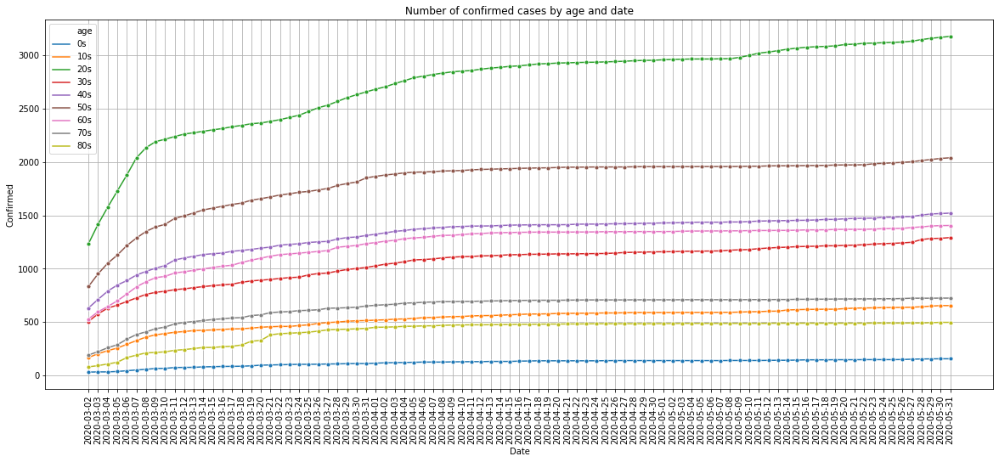

In [65]:
# 날짜별 누적확진자 그래프
plt.figure(figsize=(20,8))
sns.lineplot(data=time_group, x='date',y='confirmed',hue='age', marker='o', markersize=5)
plt.xticks(rotation=90)
plt.grid()
plt.xlabel('Date')
plt.ylabel('Confirmed')
plt.title('Number of confirmed cases by age and date')
plt.show()

# 날짜별 누적 사망자 그래프

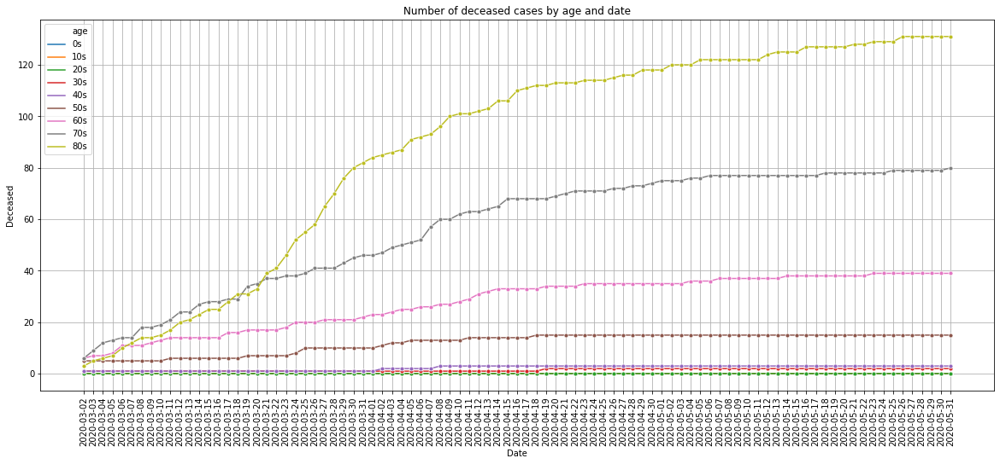

In [66]:
# 날짜별 누적 사망자 그래프
plt.figure(figsize=(20,8))
sns.lineplot(data=time_group, x='date',y='deceased',hue='age', marker='o',markersize=5)
plt.xticks(rotation=90)
plt.grid()
plt.xlabel('Date')
plt.ylabel('Deceased')
plt.title('Number of deceased cases by age and date')
plt.show()

In [67]:
# 일별 연령대별 확진자 그래프 만들기 (당일기록 (연령대별))

In [68]:
# 0대 당일 확진자, 당일 사망자 전처리 과정.
time_0s = time_group[time_group['age'] == '0s'][::-1].reset_index(drop=True)

day_confirmed = []
for i in range(len(time_0s)-1):
    day_confirmed.append(time_0s.loc[i,'confirmed'] - time_0s.loc[i+1,'confirmed'])

day_deceased = []
for i in range(len(time_0s)-1):
    day_deceased.append(time_0s.loc[i,'deceased'] - time_0s.loc[i+1,'deceased'])
# print(day_confirmed)
# print(day_deceased)
time_0s = time_0s.drop(time_0s.tail(1).index)
time_0s['day_confirmed'] = day_confirmed
time_0s['day_deceased'] = day_deceased
time_0s = time_0s[::-1].reset_index(drop=True)
display(time_0s)


# 10대 당일 확진자, 당일 사망자 전처리 과정.
time_10s = time_group[time_group['age'] == '10s'][::-1].reset_index(drop=True)

day_confirmed = []
for i in range(len(time_10s)-1):
    day_confirmed.append(time_10s.loc[i,'confirmed'] - time_10s.loc[i+1,'confirmed'])

day_deceased = []
for i in range(len(time_10s)-1):
    day_deceased.append(time_10s.loc[i,'deceased'] - time_10s.loc[i+1,'deceased'])
# print(day_confirmed)
# print(day_deceased)
time_10s = time_10s.drop(time_10s.tail(1).index)
time_10s['day_confirmed'] = day_confirmed
time_10s['day_deceased'] = day_deceased
time_10s = time_10s[::-1].reset_index(drop=True)
display(time_10s)

# 20대 당일 확진자, 당일 사망자 전처리 과정.
time_20s = time_group[time_group['age'] == '20s'][::-1].reset_index(drop=True)
# display(time_20s)
day_confirmed = []
for i in range(len(time_20s)-1):
    day_confirmed.append(time_20s.loc[i,'confirmed'] - time_20s.loc[i+1,'confirmed'])
# time_20s
day_deceased = []
for i in range(len(time_20s)-1):
    day_deceased.append(time_20s.loc[i,'deceased'] - time_20s.loc[i+1,'deceased'])
# print(day_confirmed)
# print(day_deceased)
time_20s = time_20s.drop(time_20s.tail(1).index)
time_20s['day_confirmed'] = day_confirmed
time_20s['day_deceased'] = day_deceased
time_20s = time_20s[::-1].reset_index(drop=True)
display(time_20s)

# 30대 당일 확진자, 당일 사망자 전처리 과정.
time_30s = time_group[time_group['age'] == '30s'][::-1].reset_index(drop=True)

day_confirmed = []
for i in range(len(time_30s)-1):
    day_confirmed.append(time_30s.loc[i,'confirmed'] - time_30s.loc[i+1,'confirmed'])
    
day_deceased = []
for i in range(len(time_30s)-1):
    day_deceased.append(time_30s.loc[i,'deceased'] - time_30s.loc[i+1,'deceased'])
# print(day_confirmed)
# print(day_deceased)
time_30s = time_30s.drop(time_30s.tail(1).index)
time_30s['day_confirmed'] = day_confirmed
time_30s['day_deceased'] = day_deceased
time_30s = time_30s[::-1].reset_index(drop=True)
display(time_30s)

# 40대 당일 확진자, 당일 사망자 전처리 과정.
time_40s = time_group[time_group['age'] == '40s'][::-1].reset_index(drop=True)

day_confirmed = []
for i in range(len(time_40s)-1):
    day_confirmed.append(time_40s.loc[i,'confirmed'] - time_40s.loc[i+1,'confirmed'])
    
day_deceased = []
for i in range(len(time_40s)-1):
    day_deceased.append(time_40s.loc[i,'deceased'] - time_40s.loc[i+1,'deceased'])
# print(day_confirmed)
# print(day_deceased)
time_40s = time_40s.drop(time_40s.tail(1).index)
time_40s['day_confirmed'] = day_confirmed
time_40s['day_deceased'] = day_deceased
time_40s = time_40s[::-1].reset_index(drop=True)
display(time_40s)

# 50대 당일 확진자, 당일 사망자 전처리 과정.
time_50s = time_group[time_group['age'] == '50s'][::-1].reset_index(drop=True)

day_confirmed = []
for i in range(len(time_50s)-1):
    day_confirmed.append(time_50s.loc[i,'confirmed'] - time_50s.loc[i+1,'confirmed'])
    
day_deceased = []
for i in range(len(time_50s)-1):
    day_deceased.append(time_50s.loc[i,'deceased'] - time_50s.loc[i+1,'deceased'])
# print(day_confirmed)
# print(day_deceased)
time_50s = time_50s.drop(time_50s.tail(1).index)
time_50s['day_confirmed'] = day_confirmed
time_50s['day_deceased'] = day_deceased
time_50s = time_50s[::-1].reset_index(drop=True)
display(time_50s)

# 60대 당일 확진자, 당일 사망자 전처리 과정.
time_60s = time_group[time_group['age'] == '60s'][::-1].reset_index(drop=True)

day_confirmed = []
for i in range(len(time_60s)-1):
    day_confirmed.append(time_60s.loc[i,'confirmed'] - time_60s.loc[i+1,'confirmed'])
    
day_deceased = []
for i in range(len(time_60s)-1):
    day_deceased.append(time_60s.loc[i,'deceased'] - time_60s.loc[i+1,'deceased'])
# print(day_confirmed)
# print(day_deceased)
time_60s = time_60s.drop(time_60s.tail(1).index)
time_60s['day_confirmed'] = day_confirmed
time_60s['day_deceased'] = day_deceased
time_60s = time_60s[::-1].reset_index(drop=True)
display(time_60s)

# 70대 당일 확진자, 당일 사망자 전처리 과정.
time_70s = time_group[time_group['age'] == '70s'][::-1].reset_index(drop=True)

day_confirmed = []
for i in range(len(time_70s)-1):
    day_confirmed.append(time_70s.loc[i,'confirmed'] - time_70s.loc[i+1,'confirmed'])
    
day_deceased = []
for i in range(len(time_70s)-1):
    day_deceased.append(time_70s.loc[i,'deceased'] - time_70s.loc[i+1,'deceased'])
# print(day_confirmed)
# print(day_deceased)
time_70s = time_70s.drop(time_70s.tail(1).index)
time_70s['day_confirmed'] = day_confirmed
time_70s['day_deceased'] = day_deceased
time_70s = time_70s[::-1].reset_index(drop=True)
display(time_70s)

# 80대 당일 확진자, 당일 사망자 전처리 과정.
time_80s = time_group[time_group['age'] == '80s'][::-1].reset_index(drop=True)

day_confirmed = []
for i in range(len(time_80s)-1):
    day_confirmed.append(time_80s.loc[i,'confirmed'] - time_80s.loc[i+1,'confirmed'])
    
day_deceased = []
for i in range(len(time_80s)-1):
    day_deceased.append(time_80s.loc[i,'deceased'] - time_80s.loc[i+1,'deceased'])
# print(day_confirmed)
# print(day_deceased)
time_80s = time_80s.drop(time_80s.tail(1).index)
time_80s['day_confirmed'] = day_confirmed
time_80s['day_deceased'] = day_deceased
time_80s = time_80s[::-1].reset_index(drop=True)
display(time_80s)

,date,age,confirmed,deceased,day_confirmed,day_deceased
0,2020-03-03,0s,34,0,2,0
1,2020-03-04,0s,34,0,0,0
2,2020-03-05,0s,38,0,4,0
3,2020-03-06,0s,45,0,7,0
4,2020-03-07,0s,52,0,7,0
...,...,...,...,...,...,...
85,2020-05-27,0s,153,0,3,0
86,2020-05-28,0s,155,0,2,0
87,2020-05-29,0s,156,0,1,0
88,2020-05-30,0s,157,0,1,0


,date,age,confirmed,deceased,day_confirmed,day_deceased
0,2020-03-03,10s,204,0,35,0
1,2020-03-04,10s,233,0,29,0
2,2020-03-05,10s,257,0,24,0
3,2020-03-06,10s,292,0,35,0
4,2020-03-07,10s,327,0,35,0
...,...,...,...,...,...,...
85,2020-05-27,10s,640,0,2,0
86,2020-05-28,10s,644,0,4,0
87,2020-05-29,10s,650,0,6,0
88,2020-05-30,10s,655,0,5,0


,date,age,confirmed,deceased,day_confirmed,day_deceased
0,2020-03-03,20s,1417,0,182,0
1,2020-03-04,20s,1575,0,158,0
2,2020-03-05,20s,1727,0,152,0
3,2020-03-06,20s,1877,0,150,0
4,2020-03-07,20s,2038,0,161,0
...,...,...,...,...,...,...
85,2020-05-27,20s,3131,0,8,0
86,2020-05-28,20s,3146,0,15,0
87,2020-05-29,20s,3158,0,12,0
88,2020-05-30,20s,3167,0,9,0


,date,age,confirmed,deceased,day_confirmed,day_deceased
0,2020-03-03,30s,578,1,72,0
1,2020-03-04,30s,631,1,53,0
2,2020-03-05,30s,659,1,28,0
3,2020-03-06,30s,693,1,34,0
4,2020-03-07,30s,727,1,34,0
...,...,...,...,...,...,...
85,2020-05-27,30s,1248,2,6,0
86,2020-05-28,30s,1274,2,26,0
87,2020-05-29,30s,1283,2,9,0
88,2020-05-30,30s,1285,2,2,0


,date,age,confirmed,deceased,day_confirmed,day_deceased
0,2020-03-03,40s,713,1,80,0
1,2020-03-04,40s,790,1,77,0
2,2020-03-05,40s,847,1,57,0
3,2020-03-06,40s,889,1,42,0
4,2020-03-07,40s,941,1,52,0
...,...,...,...,...,...,...
85,2020-05-27,40s,1489,3,3,0
86,2020-05-28,40s,1503,3,14,0
87,2020-05-29,40s,1513,3,10,0
88,2020-05-30,40s,1517,3,4,0


,date,age,confirmed,deceased,day_confirmed,day_deceased
0,2020-03-03,50s,952,5,118,0
1,2020-03-04,50s,1051,5,99,0
2,2020-03-05,50s,1127,5,76,0
3,2020-03-06,50s,1217,5,90,0
4,2020-03-07,50s,1287,5,70,0
...,...,...,...,...,...,...
85,2020-05-27,50s,2002,15,6,0
86,2020-05-28,50s,2014,15,12,0
87,2020-05-29,50s,2023,15,9,0
88,2020-05-30,50s,2033,15,10,0


,date,age,confirmed,deceased,day_confirmed,day_deceased
0,2020-03-03,60s,597,7,67,1
1,2020-03-04,60s,646,7,49,0
2,2020-03-05,60s,699,8,53,1
3,2020-03-06,60s,763,11,64,3
4,2020-03-07,60s,830,11,67,0
...,...,...,...,...,...,...
85,2020-05-27,60s,1386,39,8,0
86,2020-05-28,60s,1392,39,6,0
87,2020-05-29,60s,1400,39,8,0
88,2020-05-30,60s,1404,39,4,0


,date,age,confirmed,deceased,day_confirmed,day_deceased
0,2020-03-03,70s,224,9,32,3
1,2020-03-04,70s,260,12,36,3
2,2020-03-05,70s,288,13,28,1
3,2020-03-06,70s,340,14,52,1
4,2020-03-07,70s,384,14,44,0
...,...,...,...,...,...,...
85,2020-05-27,70s,724,79,3,0
86,2020-05-28,70s,724,79,0,0
87,2020-05-29,70s,724,79,0,0
88,2020-05-30,70s,725,79,1,0


,date,age,confirmed,deceased,day_confirmed,day_deceased
0,2020-03-03,80s,93,5,12,2
1,2020-03-04,80s,108,6,15,1
2,2020-03-05,80s,124,7,16,1
3,2020-03-06,80s,168,10,44,3
4,2020-03-07,80s,191,12,23,2
...,...,...,...,...,...,...
85,2020-05-27,80s,492,131,1,0
86,2020-05-28,80s,492,131,0,0
87,2020-05-29,80s,495,131,3,0
88,2020-05-30,80s,498,131,3,0


# 연령대별 당일 confirmed, deceased 시각화

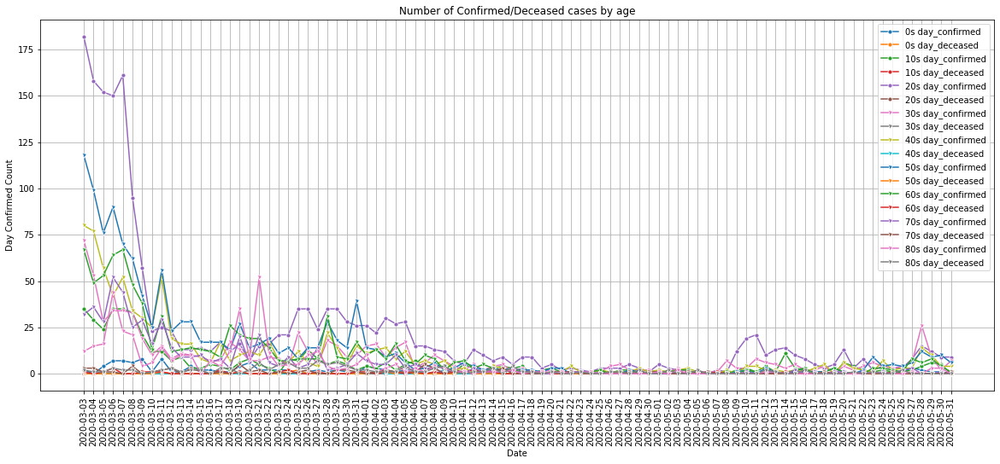

In [69]:
# 시각화 코드..
plt.figure(figsize=(20,8))
# 0대 확진자, 사망자 시각화 코드
sns.lineplot(data = time_0s, x= 'date', y= 'day_confirmed', marker= 'o', markersize=5, label= '0s day_confirmed')
sns.lineplot(data = time_0s, x= 'date', y= 'day_deceased', marker= 'o', markersize=5, label= '0s day_deceased')
# 10대 확진자, 사망자 시각화 코드
sns.lineplot(data = time_10s, x= 'date', y= 'day_confirmed', marker= 'o', markersize=5, label= '10s day_confirmed')
sns.lineplot(data = time_10s, x= 'date', y= 'day_deceased', marker= 'o', markersize=5, label= '10s day_deceased')
# 20대 확진자, 사망자 시각화 코드
sns.lineplot(data = time_20s, x= 'date', y= 'day_confirmed', marker= 'o', markersize=5, label= '20s day_confirmed')
sns.lineplot(data = time_20s, x= 'date', y= 'day_deceased', marker= 'o', markersize=5, label= '20s day_deceased')
# 30대 확진자, 사망자 시각화 코드
sns.lineplot(data = time_30s, x= 'date', y= 'day_confirmed', marker= 'v', markersize=5, label= '30s day_confirmed')
sns.lineplot(data = time_30s, x= 'date', y= 'day_deceased', marker= 'v', markersize=5, label= '30s day_deceased')
# 40대 확진자, 사망자 시각화 코드
sns.lineplot(data = time_40s, x= 'date', y= 'day_confirmed', marker= 'v', markersize=5, label= '40s day_confirmed')
sns.lineplot(data = time_40s, x= 'date', y= 'day_deceased', marker= 'v', markersize=5, label= '40s day_deceased')
# 50대 확진자, 사망자 시각화 코드
sns.lineplot(data = time_50s, x= 'date', y= 'day_confirmed', marker= 'v', markersize=5, label= '50s day_confirmed')
sns.lineplot(data = time_50s, x= 'date', y= 'day_deceased', marker= 'v', markersize=5, label= '50s day_deceased')
# 60대 확진자, 사망자 시각화 코드
sns.lineplot(data = time_60s, x= 'date', y= 'day_confirmed', marker= 'v', markersize=5, label= '60s day_confirmed')
sns.lineplot(data = time_60s, x= 'date', y= 'day_deceased', marker= 'v', markersize=5, label= '60s day_deceased')
# 70대 확진자, 사망자 시각화 코드
sns.lineplot(data = time_70s, x= 'date', y= 'day_confirmed', marker= 'v', markersize=5, label= '70s day_confirmed')
sns.lineplot(data = time_70s, x= 'date', y= 'day_deceased', marker= 'v', markersize=5, label= '70s day_deceased')
# 80대 확진자, 사망자 시각화 코드
sns.lineplot(data = time_80s, x= 'date', y= 'day_confirmed', marker= 'v', markersize=5, label= '80s day_confirmed')
sns.lineplot(data = time_80s, x= 'date', y= 'day_deceased', marker= 'v', markersize=5, label= '80s day_deceased')

plt.xticks(rotation=90)
plt.xlabel('Date')
plt.ylabel('Day Confirmed Count')
plt.title('Number of Confirmed/Deceased cases by age')
plt.legend()
plt.grid()
plt.show()

# 연령대별 당일 confirmed 시각화

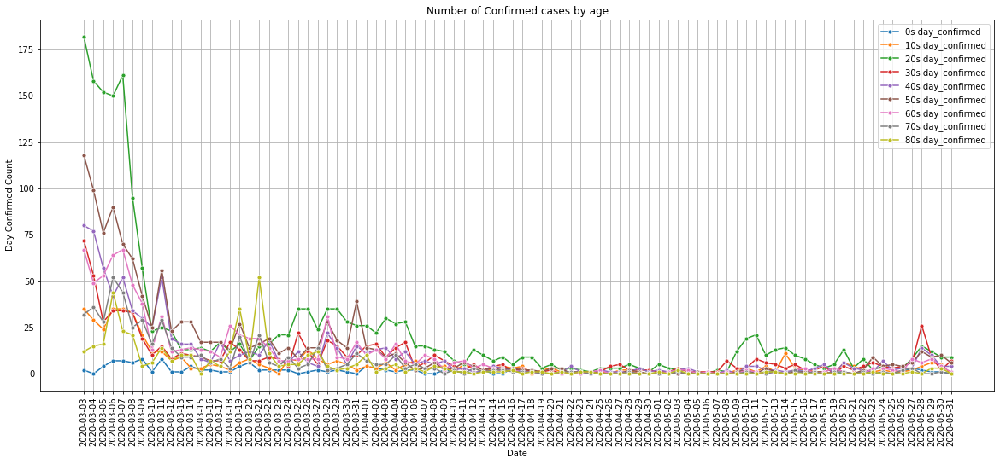

In [70]:
plt.figure(figsize=(20,8))
sns.lineplot(data = time_0s, x= 'date', y= 'day_confirmed', marker= 'o', markersize=5, label= '0s day_confirmed')
sns.lineplot(data = time_10s, x= 'date', y= 'day_confirmed', marker= 'o', markersize=5, label= '10s day_confirmed')
sns.lineplot(data = time_20s, x= 'date', y= 'day_confirmed', marker= 'o', markersize=5, label= '20s day_confirmed')
sns.lineplot(data = time_30s, x= 'date', y= 'day_confirmed', marker= 'o', markersize=5, label= '30s day_confirmed')
sns.lineplot(data = time_40s, x= 'date', y= 'day_confirmed', marker= 'o', markersize=5, label= '40s day_confirmed')
sns.lineplot(data = time_50s, x= 'date', y= 'day_confirmed', marker= 'o', markersize=5, label= '50s day_confirmed')
sns.lineplot(data = time_60s, x= 'date', y= 'day_confirmed', marker= 'o', markersize=5, label= '60s day_confirmed')
sns.lineplot(data = time_70s, x= 'date', y= 'day_confirmed', marker= 'o', markersize=5, label= '70s day_confirmed')
sns.lineplot(data = time_80s, x= 'date', y= 'day_confirmed', marker= 'o', markersize=5, label= '80s day_confirmed')

plt.xticks(rotation=90)
plt.xlabel('Date')
plt.ylabel('Day Confirmed Count')
plt.title('Number of Confirmed cases by age')
plt.legend()
plt.grid()
plt.show()

# 연령대별 당일 Deceased 시각화

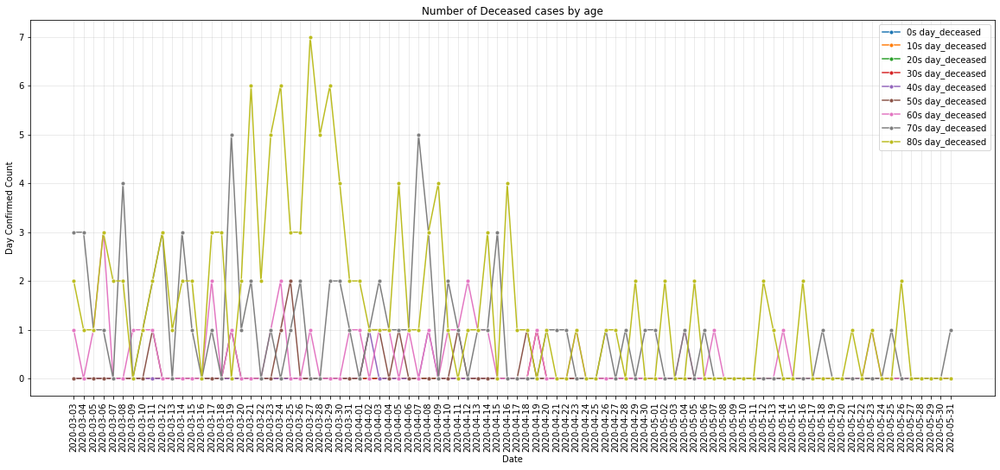

In [71]:
plt.figure(figsize=(20,8))
sns.lineplot(data = time_0s, x= 'date', y= 'day_deceased', marker= 'o', markersize=5, label= '0s day_deceased')
sns.lineplot(data = time_10s, x= 'date', y= 'day_deceased', marker= 'o', markersize=5, label= '10s day_deceased')
sns.lineplot(data = time_20s, x= 'date', y= 'day_deceased', marker= 'o', markersize=5, label= '20s day_deceased')
sns.lineplot(data = time_30s, x= 'date', y= 'day_deceased', marker= 'o', markersize=5, label= '30s day_deceased')
sns.lineplot(data = time_40s, x= 'date', y= 'day_deceased', marker= 'o', markersize=5, label= '40s day_deceased')
sns.lineplot(data = time_50s, x= 'date', y= 'day_deceased', marker= 'o', markersize=5, label= '50s day_deceased')
sns.lineplot(data = time_60s, x= 'date', y= 'day_deceased', marker= 'o', markersize=5, label= '60s day_deceased')
sns.lineplot(data = time_70s, x= 'date', y= 'day_deceased', marker= 'o', markersize=5, label= '70s day_deceased')
sns.lineplot(data = time_80s, x= 'date', y= 'day_deceased', marker= 'o', markersize=5, label= '80s day_deceased')

plt.xticks(rotation=90)
plt.xlabel('Date')
plt.ylabel('Day Confirmed Count')
plt.title('Number of Deceased cases by age')
plt.legend()
plt.grid(alpha=0.3)
plt.show()

# PatientInfo.csv, PatientRoute.csv 데이터 로드 

In [74]:
# patient_info 와 patient_route 데이터 patient_id 를 키로 merge 시킨다.
patient_info = pd.read_csv('PatientInfo.csv')
display(patient_info.head())
patient_route = pd.read_csv('PatientRoute.csv')
patient_route.head()

,patient_id,global_num,sex,birth_year,age,country,province,city,disease,infection_case,infection_order,infected_by,contact_number,symptom_onset_date,confirmed_date,released_date,deceased_date,state
0,1000000001,2.0,male,1964,50s,Korea,Seoul,Gangseo-gu,NaN,overseas inflow,1.0,NaN,75,2020-01-22,2020-01-23,2020-02-05,NaN,released
1,1000000002,5.0,male,1987,30s,Korea,Seoul,Jungnang-gu,NaN,overseas inflow,1.0,NaN,31,NaN,2020-01-30,2020-03-02,NaN,released
2,1000000003,6.0,male,1964,50s,Korea,Seoul,Jongno-gu,NaN,contact with patient,2.0,2002000001,17,NaN,2020-01-30,2020-02-19,NaN,released
3,1000000004,7.0,male,1991,20s,Korea,Seoul,Mapo-gu,NaN,overseas inflow,1.0,NaN,9,2020-01-26,2020-01-30,2020-02-15,NaN,released
4,1000000005,9.0,female,1992,20s,Korea,Seoul,Seongbuk-gu,NaN,contact with patient,2.0,1000000002,2,NaN,2020-01-31,2020-02-24,NaN,released


,patient_id,global_num,date,province,city,type,latitude,longitude
0,1000000001,2.0,2020-01-22,Gyeonggi-do,Gimpo-si,airport,37.615246,126.715632
1,1000000001,2.0,2020-01-24,Seoul,Jung-gu,hospital,37.567241,127.005659
2,1000000002,5.0,2020-01-25,Seoul,Seongbuk-gu,etc,37.592560,127.017048
3,1000000002,5.0,2020-01-26,Seoul,Seongbuk-gu,store,37.591810,127.016822
4,1000000002,5.0,2020-01-26,Seoul,Seongdong-gu,public_transportation,37.563992,127.029534


In [75]:
# 중복된 환자 ID는 없어 보인다.
print(f"데이터 행의 수 = {patient_info.shape[0]}")
print(f"고유한 환자 ID 수 = {patient_info['patient_id'].nunique()}")

데이터 행의 수 = 4004
고유한 환자 ID 수 = 4004


In [76]:
# patient_info 전처리
patient_info = patient_info[['patient_id','sex','age','country','province','infection_case','contact_number','state']]

In [77]:
# 결측치 확인.
# 환자 id는 결측치 없고, infection_case는 결측치 존재..
# 추후 infection_case의 결측치는 etc와 함께 분류.
patient_info.isnull().sum()

patient_id           0
sex                330
age                479
country              0
province             0
infection_case     793
contact_number    3324
state                0
dtype: int64

In [78]:
# 감염 경로의 가지수.
patient_info['infection_case'].nunique()

29

In [79]:
# infection_case의 결측값을 제외한 환자의 수.
res = patient_info.groupby('infection_case')['patient_id'].count().sum()
print('감염 경로 결측값 제외한 환자의 수',res)
res = patient_info.groupby('infection_case')['patient_id'].count()
print('감염 경로별 환자의 수\n',res)
# reset_index 명령으로 인덱스를 보통의 자료열로 바꿀 수도 있다. 
# 이 때 인덱스 열은 자료열의 가장 선두로 삽입된다. 
# 데이터프레임의 인덱스는 정수로 된 디폴트 인덱스로 바뀐다.
res = res.reset_index()
# 내림차순 정렬
res = res.sort_values('patient_id', ascending=False)
res

감염 경로 결측값 제외한 환자의 수 3211
감염 경로별 환자의 수
 infection_case
Bonghwa Pureun Nursing Home                31
Changnyeong Coin Karaoke                    4
Cheongdo Daenam Hospital                   21
Coupang Logistics Center                   70
Dongan Church                              17
Eunpyeong St. Mary's Hospital              16
Geochang Church                             6
Guri Collective Infection                   6
Guro-gu Call Center                       112
Gyeongsan Cham Joeun Community Center      10
Gyeongsan Jeil Silver Town                 12
Gyeongsan Seorin Nursing Home              15
Itaewon Clubs                             156
KB Life Insurance                           8
Milal Shelter                              11
Ministry of Oceans and Fisheries           28
Onchun Church                              33
Pilgrimage to Israel                        2
River of Grace Community Church             1
Samsung Medical Center                      7
Seongdong-gu APT          

,infection_case,patient_id
24,contact with patient,1182
28,overseas inflow,703
25,etc,601
12,Itaewon Clubs,156
8,Guro-gu Call Center,112
21,Shincheonji Church,107
3,Coupang Logistics Center,70
16,Onchun Church,33
0,Bonghwa Pureun Nursing Home,31
26,gym facility in Cheonan,30


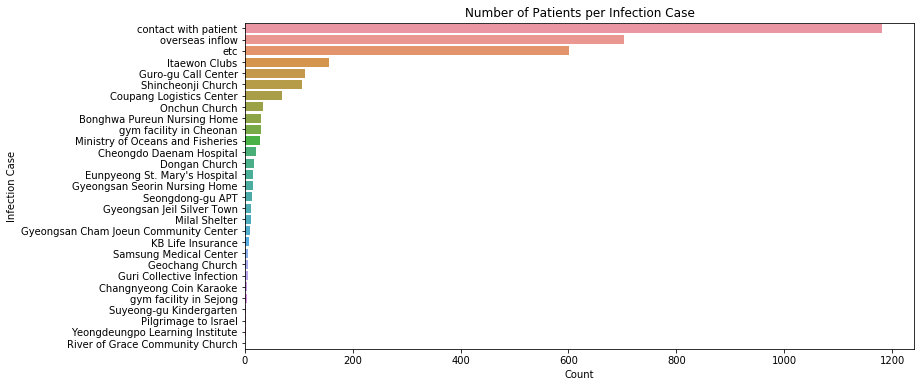

In [80]:
plt.figure(figsize=(12,6))
sns.barplot(y='infection_case', x='patient_id', data=res)
plt.xlabel('Count')
plt.ylabel('Infection Case')
plt.title('Number of Patients per Infection Case')
plt.show()

Unknown       1394
Individual    1182
Group          725
Overseas       703
Name: infection_case, dtype: int64
        index  infection_case
0     Unknown            1394
1  Individual            1182
2       Group             725
3    Overseas             703
  infection_cause  patient_counts
0         Unknown            1394
1      Individual            1182
2           Group             725
3        Overseas             703


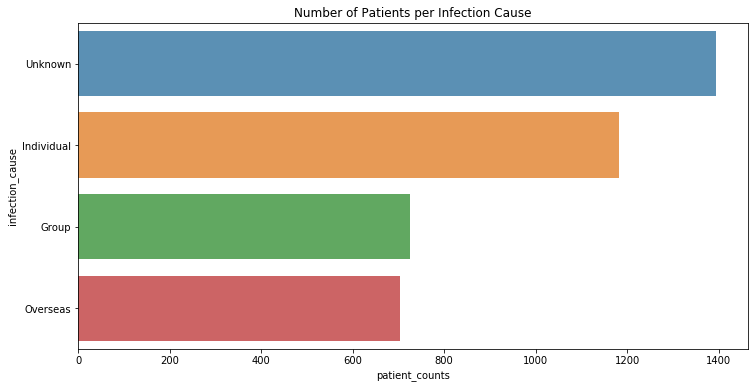

In [81]:
my_dict = {'contact with patient':'Individual', 
           'etc':'Unknown', 'overseas inflow':'Overseas'}
# 
def transe(x):
    if not pd.isnull(x):
        if x in my_dict.keys():
            return my_dict[x]
        else:
            return "Group"
    else:
        return "Unknown"
    
res = patient_info['infection_case'].apply(transe)
# print(res)
patient_info['infection_cause'] = res
res = res.value_counts().sort_values(ascending=False)
print(res)
res = res.reset_index()
print(res)
res.rename(columns={'index':'infection_cause','infection_case':'patient_counts'}, inplace=True)
print(res)
plt.figure(figsize = (12,6))
sns.barplot(y = 'infection_cause', x= 'patient_counts', data = res, alpha=0.8)
plt.xlabel('patient_counts')
plt.ylabel('infection_cause')
plt.title('Number of Patients per Infection Cause')
plt.show()

In [82]:
patient_route = pd.read_csv('PatientRoute.csv')
patient_route.head()

,patient_id,global_num,date,province,city,type,latitude,longitude
0,1000000001,2.0,2020-01-22,Gyeonggi-do,Gimpo-si,airport,37.615246,126.715632
1,1000000001,2.0,2020-01-24,Seoul,Jung-gu,hospital,37.567241,127.005659
2,1000000002,5.0,2020-01-25,Seoul,Seongbuk-gu,etc,37.592560,127.017048
3,1000000002,5.0,2020-01-26,Seoul,Seongbuk-gu,store,37.591810,127.016822
4,1000000002,5.0,2020-01-26,Seoul,Seongdong-gu,public_transportation,37.563992,127.029534


In [83]:
# 결측치의 총 카운트.
patient_route.isnull().sum().sum()

3264

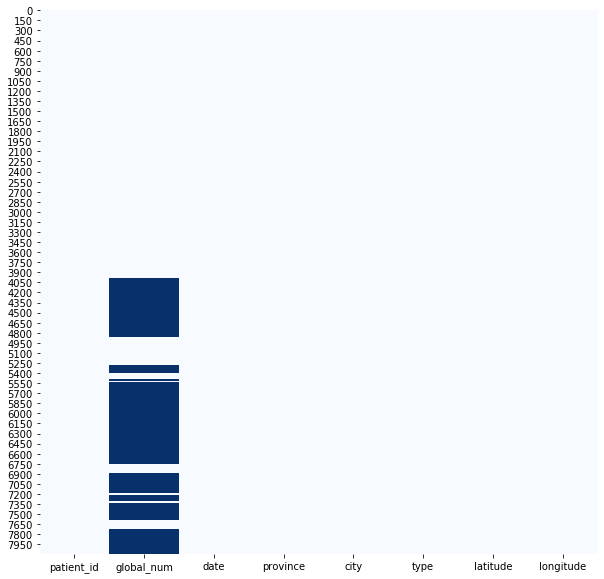

In [84]:
# 결측치를 시각화 해본다.
plt.figure(figsize = (10,10))                                       # figsize=(가로, 세로) 크기.
sns.heatmap(patient_route.isnull(), cmap='Blues', cbar=False)
plt.show()

In [85]:
# 중복된 환자 ID가 많아 보인다.
print(f"데이터 행의 수 = {patient_route.shape[0]}")
print(f"고유한 환자 ID 수 = {patient_route['patient_id'].nunique()}")

데이터 행의 수 = 8092
고유한 환자 ID 수 = 1472


In [86]:
# patient_route data 전처리
patient_route = patient_route[['patient_id','type','latitude','longitude']]
patient_route

,patient_id,type,latitude,longitude
0,1000000001,airport,37.615246,126.715632
1,1000000001,hospital,37.567241,127.005659
2,1000000002,etc,37.592560,127.017048
3,1000000002,store,37.591810,127.016822
4,1000000002,public_transportation,37.563992,127.029534
...,...,...,...,...
8087,6100000090,airport,37.558654,126.794474
8088,6100000090,airport,35.173220,128.946459
8089,6100000090,store,35.336944,129.026389
8090,6100000090,hospital,35.335757,129.025003


In [87]:
# 결측치 확인해준다.
patient_route.isnull().sum()

patient_id    0
type          0
latitude      0
longitude     0
dtype: int64

# 전체 감염자 이동경로 시각화.

In [88]:
# 전체 감염자 이동경로 시각화.
# 첫 시작 위치 설정 변수
loc = [37.5502, 126.982]
#  for문을 돌기 위한 데이터 총 수를 patient_route_size에 저장
patient_route_size = len(patient_route)
# Map함수를 이용해서 folium의 map객체를 불러온다 location 값에 위에서 설정한 loc값을 사용 // zoom_start 는 얼마나 확대해서 첫화면을 보여줄지 결정
route_map = folium.Map(location=loc, zoom_start=13)

# for문을 돌면서 맵객체에 Circle을 하나씩 추가해 나간다.
for i in range(patient_route_size):
    folium.Circle(list(patient_route.iloc[i][['latitude','longitude']]),
                 popup=patient_route.iloc[i]['type'],
                 radius=50, fill=True, fill_color='#FF0000',color='#FF0000').add_to(route_map)
#     break
route_map

In [89]:
print('감염 후 동선\n',patient_route['type'].unique())
print('감염 후 동선 가지 수',patient_route['type'].nunique())

감염 후 동선
 ['airport' 'hospital' 'etc' 'store' 'public_transportation' 'restaurant'
 'church' 'beauty_salon' 'pharmacy' 'pc_cafe' 'bank' 'academy' 'cafe'
 'bakery' 'bar' 'gym' 'school' 'real_estate_agency' 'karaoke'
 'post_office' 'gas_station' 'park' 'lodging' 'university'
 'administrative_area_level_1']
감염 후 동선 가지 수 25


# 감염환자 동선 파악 시각화.

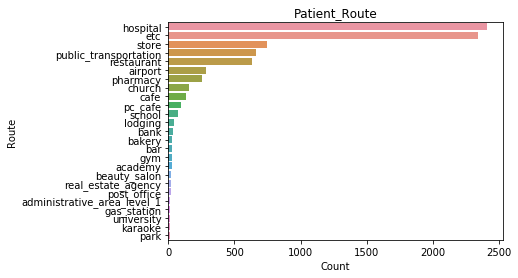

In [90]:
# 감염환자 동선 파악 시각화. (가장 많이 방문한 곳은 어디?)
# 유의미한 방문이니? 유의미하지 않은 방문이니?
res = patient_route.groupby('type').count().sort_values('patient_id',ascending=False)
res = res.reset_index()
res
sns.barplot(y='type',x='patient_id',data=res)
plt.title('Patient_Route')
plt.xlabel('Count')
plt.ylabel('Route')
plt.show()

In [91]:
# 유의미한 변수 추출....
# administrative_area_level_1 이게 뭐지? (국가기관..동사무소같은)
essential = ['hospital','store','public_transportation','pharmacy','bank','school',
             'gas_station','post_office','university','administrative_area_level_1']

In [92]:
# 필수적 / 부수적 여부의 변수 생성 is_essential
def isessential(x):
    if x in essential:
        res = True
    else:
        res = False
    return res
patient_route['is_essential'] = patient_route['type'].apply(isessential)
patient_route

,patient_id,type,latitude,longitude,is_essential
0,1000000001,airport,37.615246,126.715632,False
1,1000000001,hospital,37.567241,127.005659,True
2,1000000002,etc,37.592560,127.017048,False
3,1000000002,store,37.591810,127.016822,True
4,1000000002,public_transportation,37.563992,127.029534,True
...,...,...,...,...,...
8087,6100000090,airport,37.558654,126.794474,False
8088,6100000090,airport,35.173220,128.946459,False
8089,6100000090,store,35.336944,129.026389,True
8090,6100000090,hospital,35.335757,129.025003,True


In [93]:
display(patient_info)
display(patient_route)

,patient_id,sex,age,country,province,infection_case,contact_number,state,infection_cause
0,1000000001,male,50s,Korea,Seoul,overseas inflow,75,released,Overseas
1,1000000002,male,30s,Korea,Seoul,overseas inflow,31,released,Overseas
2,1000000003,male,50s,Korea,Seoul,contact with patient,17,released,Individual
3,1000000004,male,20s,Korea,Seoul,overseas inflow,9,released,Overseas
4,1000000005,female,20s,Korea,Seoul,contact with patient,2,released,Individual
...,...,...,...,...,...,...,...,...,...
3999,7000000010,female,20s,Korea,Jeju-do,overseas inflow,18,released,Overseas
4000,7000000011,male,30s,Korea,Jeju-do,contact with patient,5,isolated,Individual
4001,7000000012,female,20s,Korea,Jeju-do,overseas inflow,9,released,Overseas
4002,7000000013,female,10s,China,Jeju-do,overseas inflow,6,released,Overseas


,patient_id,type,latitude,longitude,is_essential
0,1000000001,airport,37.615246,126.715632,False
1,1000000001,hospital,37.567241,127.005659,True
2,1000000002,etc,37.592560,127.017048,False
3,1000000002,store,37.591810,127.016822,True
4,1000000002,public_transportation,37.563992,127.029534,True
...,...,...,...,...,...
8087,6100000090,airport,37.558654,126.794474,False
8088,6100000090,airport,35.173220,128.946459,False
8089,6100000090,store,35.336944,129.026389,True
8090,6100000090,hospital,35.335757,129.025003,True


In [94]:
# 결측치 확인해준다. patient_info 데이터와 patient_route 데이터의 patient_id로 merge
# 연령대 별 위도 경도가 필요. age결측치가 많이 보인다... 결측치 열 삭제 하면 될듯?! 
patient_map_merge = pd.merge(patient_route, patient_info,on='patient_id')
patient_map_merge.isnull().sum()

patient_id            0
type                  0
latitude              0
longitude             0
is_essential          0
sex                1380
age                1380
country               0
province              0
infection_case      434
contact_number     5674
state                 0
infection_cause       0
dtype: int64

In [95]:
# shape 확인
patient_map_merge.shape

(8092, 13)

In [96]:
# age의 유니크한 값들 확인 nan 값 확인 할 수 있습니다. nan값을 가진 열은 모두 삭제 할거야.
patient_map_merge['age'].unique()

array(['50s', '30s', '20s', '60s', '80s', '70s', '40s', '10s', '90s',
       '0s', nan], dtype=object)

In [97]:
# dropna의 subset=['age'] 옵션을 사용해서 age에 결측치가 있는 모든 행을 삭제 시켜준다. reset_index() index값 초기화 drop=True 사용해서 index 튀어나오지 않게 해준다.
patient_map_merge = patient_map_merge.dropna(subset=['age'], how='any', axis=0).reset_index(drop=True)

In [125]:
# 데이터 확인
patient_map_merge

,patient_id,type,latitude,longitude,is_essential,sex,age,country,province,infection_case,contact_number,state,infection_cause
0,1000000001,airport,37.615246,126.715632,False,male,50s,Korea,Seoul,overseas inflow,75,released,Overseas
1,1000000001,hospital,37.567241,127.005659,True,male,50s,Korea,Seoul,overseas inflow,75,released,Overseas
2,1000000002,etc,37.592560,127.017048,False,male,30s,Korea,Seoul,overseas inflow,31,released,Overseas
3,1000000002,store,37.591810,127.016822,True,male,30s,Korea,Seoul,overseas inflow,31,released,Overseas
4,1000000002,public_transportation,37.563992,127.029534,True,male,30s,Korea,Seoul,overseas inflow,31,released,Overseas
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6707,6100000090,airport,37.558654,126.794474,False,male,40s,Korea,Gyeongsangnam-do,overseas inflow,NaN,released,Overseas
6708,6100000090,airport,35.173220,128.946459,False,male,40s,Korea,Gyeongsangnam-do,overseas inflow,NaN,released,Overseas
6709,6100000090,store,35.336944,129.026389,True,male,40s,Korea,Gyeongsangnam-do,overseas inflow,NaN,released,Overseas
6710,6100000090,hospital,35.335757,129.025003,True,male,40s,Korea,Gyeongsangnam-do,overseas inflow,NaN,released,Overseas


# 요기 다시 전처리 해야해 재증아

In [130]:
# 연령대별 데이터 전처리 과정 
# patient_map_merge['age']가 20인것과 30인것의 데이터 만 따로 map_20s_30s 변수에 담아준다.
map_20s_30s = patient_map_merge[(patient_map_merge['age'] == '20s') | (patient_map_merge['age'] == '30s')]
# 필요한 컬럼들만 가지고 와준다.
map_20s_30s = map_20s_30s[['patient_id','type','latitude','longitude','age']]
display(map_20s_30s)

# 위의 과정과 동일
map_40s_50s = patient_map_merge[(patient_map_merge['age'] == '40s') | (patient_map_merge['age'] == '50s')]
map_40s_50s = map_40s_50s[['patient_id','type','latitude','longitude','age']]
# map_40s_50s

map_60s_70s = patient_map_merge[(patient_map_merge['age'] == '60s') | (patient_map_merge['age'] == '70s')]
map_60s_70s = map_60s_70s[['patient_id','type','latitude','longitude','age']]
# map_60s_70s

,patient_id,type,latitude,longitude,age
2,1000000002,etc,37.592560,127.017048,30s
3,1000000002,store,37.591810,127.016822,30s
4,1000000002,public_transportation,37.563992,127.029534,30s
5,1000000002,public_transportation,37.590330,127.015221,30s
6,1000000002,store,37.589590,127.009766,30s
...,...,...,...,...,...
6698,6100000088,etc,35.235299,128.670257,20s
6699,6100000088,etc,35.234828,128.669467,20s
6700,6100000088,pharmacy,35.236901,128.642847,20s
6701,6100000088,bakery,35.236140,128.675229,20s


In [100]:
# 연령대별 전처리 과정...
map_20s = patient_map_merge[patient_map_merge['age'] == '20s']
map_20s = map_20s[['patient_id','type','latitude','longitude','age']]

map_30s = patient_map_merge[patient_map_merge['age'] == '30s']
map_30s = map_30s[['patient_id','type','latitude','longitude','age']]

map_40s = patient_map_merge[patient_map_merge['age'] == '40s']
map_40s = map_40s[['patient_id','type','latitude','longitude','age']]

map_50s = patient_map_merge[patient_map_merge['age'] == '50s']
map_50s = map_50s[['patient_id','type','latitude','longitude','age']]

map_60s = patient_map_merge[patient_map_merge['age'] == '60s']
map_60s = map_60s[['patient_id','type','latitude','longitude','age']]

map_70s = patient_map_merge[patient_map_merge['age'] == '70s']
map_70s = map_70s[['patient_id','type','latitude','longitude','age']]
map_30s

,patient_id,type,latitude,longitude,age
2,1000000002,etc,37.592560,127.017048,30s
3,1000000002,store,37.591810,127.016822,30s
4,1000000002,public_transportation,37.563992,127.029534,30s
5,1000000002,public_transportation,37.590330,127.015221,30s
6,1000000002,store,37.589590,127.009766,30s
...,...,...,...,...,...
6588,6100000061,store,35.544556,128.492214,30s
6589,6100000061,cafe,35.541315,128.500770,30s
6590,6100000061,etc,35.541315,128.500770,30s
6591,6100000061,hospital,35.543652,128.490086,30s


# 20-30대 확진자 경로 // 40-50대 확진자 경로 // 60-70대 확진자 경로 시각화
### 20-30 파랑색 // 40-50 빨강색 // 60-70 초록색

In [131]:
# 20~30대 확진자 경로 // 40~50대 확진자 경로 // 60~70대 확진자 경로
# 20~30 파랑색 // 40~50 빨강색 // 60~70 초록색

loc = [37.5502, 126.982]

map_20s_30s_size = len(map_20s_30s)
map_40s_50s_size = len(map_40s_50s)
map_60s_70s_size = len(map_60s_70s)

result_map = folium.Map(location=loc, zoom_start=13)

for i in range(map_20s_30s_size):
    folium.Circle(list(map_20s_30s.iloc[i][['latitude','longitude']]),
                 popup=map_20s_30s.iloc[i]['type'],
                 radius=70, fill=True, fill_color='#0000DB',color='#0000DB').add_to(result_map)

for i in range(map_40s_50s_size):
    folium.Circle(list(map_40s_50s.iloc[i][['latitude','longitude']]),
                 popup=map_40s_50s.iloc[i]['type'],
                 radius=70, fill=True, fill_color='#FF0000',color='#FF0000').add_to(result_map)
    
for i in range(map_60s_70s_size):
    folium.Circle(list(map_60s_70s.iloc[i][['latitude','longitude']]),
                 popup=map_60s_70s.iloc[i]['type'],
                 radius=70, fill=True, fill_color='#006F00',color='#006F00').add_to(result_map)
    
result_map

In [103]:
patient_route['route_value'] = 1
print(patient_route)
result_route = pd.pivot_table(data=patient_route, index='patient_id',
                               columns='is_essential',values='route_value',
                               aggfunc='sum', fill_value=0)
result_route

      patient_id                   type   latitude   longitude  is_essential  \
0     1000000001                airport  37.615246  126.715632         False   
1     1000000001               hospital  37.567241  127.005659          True   
2     1000000002                    etc  37.592560  127.017048         False   
3     1000000002                  store  37.591810  127.016822          True   
4     1000000002  public_transportation  37.563992  127.029534          True   
...          ...                    ...        ...         ...           ...   
8087  6100000090                airport  37.558654  126.794474         False   
8088  6100000090                airport  35.173220  128.946459         False   
8089  6100000090                  store  35.336944  129.026389          True   
8090  6100000090               hospital  35.335757  129.025003          True   
8091  6100000090                  store  35.336944  129.026389          True   

      route_value  
0               1  

is_essential,False,True
patient_id,,
1000000001,1,1
1000000002,4,9
1000000003,2,0
1000000004,0,1
1000000005,0,1
...,...,...
6100000086,1,3
6100000087,2,6
6100000088,19,5


In [104]:
# 컬럼명 재설정
result_route.columns.name=None
result_route = result_route.reset_index()
result_route = result_route.rename(columns={False:'non_essential',True:'essential'})
result_route

,patient_id,non_essential,essential
0,1000000001,1,1
1,1000000002,4,9
2,1000000003,2,0
3,1000000004,0,1
4,1000000005,0,1
...,...,...,...
1467,6100000086,1,3
1468,6100000087,2,6
1469,6100000088,19,5
1470,6100000089,1,1


In [105]:
patient_merge = patient_info.merge(result_route, left_on='patient_id', right_on='patient_id', how='inner')
patient_merge

,patient_id,sex,age,country,province,infection_case,contact_number,state,infection_cause,non_essential,essential
0,1000000001,male,50s,Korea,Seoul,overseas inflow,75,released,Overseas,1,1
1,1000000002,male,30s,Korea,Seoul,overseas inflow,31,released,Overseas,4,9
2,1000000003,male,50s,Korea,Seoul,contact with patient,17,released,Individual,2,0
3,1000000004,male,20s,Korea,Seoul,overseas inflow,9,released,Overseas,0,1
4,1000000005,female,20s,Korea,Seoul,contact with patient,2,released,Individual,0,1
...,...,...,...,...,...,...,...,...,...,...,...
1467,6100000086,male,50s,Korea,Gyeongsangnam-do,etc,NaN,isolated,Unknown,1,3
1468,6100000087,female,50s,Korea,Gyeongsangnam-do,etc,NaN,isolated,Unknown,2,6
1469,6100000088,male,20s,Korea,Gyeongsangnam-do,etc,NaN,released,Unknown,19,5
1470,6100000089,male,60s,Korea,Gyeongsangnam-do,etc,NaN,released,Unknown,1,1


In [117]:
# 나이대별 필요한곳 방문한 경우 // 필요하지 않은곳 방문한 경우
age_essential = patient_merge.groupby('age')[['non_essential','essential']].sum()
age_essential = age_essential.reset_index()
age_essential

,age,non_essential,essential
0,0s,26,46
1,10s,172,181
2,20s,1009,889
3,30s,516,540
4,40s,567,560
5,50s,578,640
6,60s,363,352
7,70s,87,107
8,80s,10,61
9,90s,2,6


# 연령대별 필요한 곳을 방문한 // 불필요한 곳을 방문한 횟수 시각화

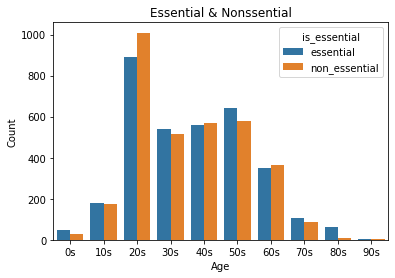

In [120]:
# 새로운 데이터 프레임을 만들어서 내가 원하는 시각화를 할 수 있게 전처리해준다.
# age_e 라는 새로운 dataframe생성 columns명은 age Series 내용물은 age_essential['age']
age_e = pd.DataFrame(age_essential['age'], columns=['age'])
# display(age_e)
# age_e['value'] 라는 컬럼을 새로 만들어 주고, 값은 age_essential['essential']을 넣어준다.
age_e['value'] = age_essential['essential']
# display(age_e)
# age_e['is_essential'] 라는 컬럼을 새로 만들어 주고, 값은 모두 essential로 채워준다.
age_e['is_essential'] = 'essential'
# display(age_e)

# 위의 과정과 동일
age_n = pd.DataFrame(age_essential['age'], columns=['age'])
age_n['value'] = age_essential['non_essential']
age_n['is_essential'] = 'non_essential'
age_n

# age라는 새로운 변수에 age_e값에 age_n을 append 시켜준다. ignore_index=True 를 사용해 인덱스 초기화 시켜준다.
age = age_e.append(age_n, ignore_index=True)
# display(age)

sns.barplot(data=age,x='age',y='value',hue='is_essential')
plt.xlabel('Age')
plt.ylabel('Count')
plt.title('Essential & Nonssential')
plt.show()

    age   is_essential  value
0    0s  non_essential     26
1    0s      essential     46
2   10s  non_essential    172
3   10s      essential    181
4   20s  non_essential   1009
5   20s      essential    889
6   30s  non_essential    516
7   30s      essential    540
8   40s  non_essential    567
9   40s      essential    560
10  50s  non_essential    578
11  50s      essential    640
12  60s  non_essential    363
13  60s      essential    352
14  70s  non_essential     87
15  70s      essential    107
16  80s  non_essential     10
17  80s      essential     61
18  90s  non_essential      2
19  90s      essential      6


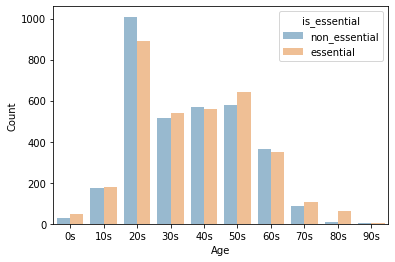

In [109]:
# 해답 찾기전까진 일단 노가다 구현...[0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1],
# 0불필요한곳(non_essential) // 1필요한곳(essential)
data = {
    'age':['0s','0s','10s','10s','20s','20s','30s','30s','40s','40s','50s','50s',
           '60s','60s','70s','70s','80s','80s','90s','90s'],
    'is_essential':  ['non_essential', 'essential','non_essential', 'essential','non_essential', 'essential','non_essential', 'essential','non_essential', 'essential',
  'non_essential', 'essential','non_essential', 'essential','non_essential', 'essential','non_essential', 'essential','non_essential', 'essential'],
    'value':[26,46,172,181,1009,889,516,540,567,560,578,640,363,352,87,107,10,61,2,6]
}
example = pd.DataFrame(data)
print(example)
sns.barplot(y='value',x='age', hue='is_essential', data=example, alpha=0.5)
plt.xlabel('Age')
plt.ylabel('Count')
plt.show()
# sns.barplot(y='age', x='non_essential' ,data=age_essential, alpha=0.3)

# 서울 유동인구 데이터.

In [110]:
seoul_floating = pd.read_csv('SeoulFloating.csv')
seoul_floating

,date,hour,birth_year,sex,province,city,fp_num
0,2020-01-01,0,20,female,Seoul,Dobong-gu,19140
1,2020-01-01,0,20,male,Seoul,Dobong-gu,19950
2,2020-01-01,0,20,female,Seoul,Dongdaemun-gu,25450
3,2020-01-01,0,20,male,Seoul,Dongdaemun-gu,27050
4,2020-01-01,0,20,female,Seoul,Dongjag-gu,28880
...,...,...,...,...,...,...,...
863995,2020-04-30,22,40,female,Seoul,Seongdong-gu,22150
863996,2020-04-30,22,50,female,Seoul,Seodaemun-gu,23270
863997,2020-04-30,23,20,female,Seoul,Yongsan-gu,18570
863998,2020-04-30,23,30,female,Seoul,Seodaemun-gu,21100


# 연령대별 시간대별 유동인구 시각화

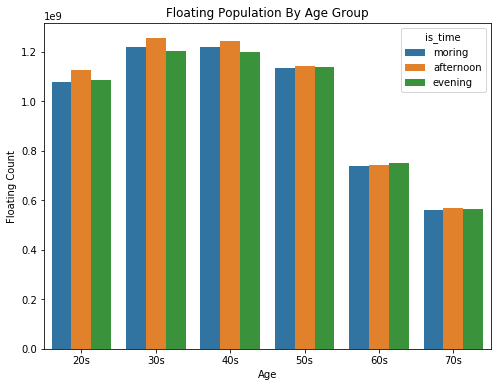

In [123]:
# 그래프 그리기 위해 다시 한번 전처리 과정
# age_m이라는 새로운 데이터 프레임을 만들어 준다. 컬럼명은 age, 내용물은 seoul_floating['birth_year']의 유니크한 값을 사용(20~70이 들어있음)
age_m = pd.DataFrame(seoul_floating['birth_year'].unique(), columns=['age'])
# display(age_m)
# moring_floating 변수에 오전에 해당하는 새로운 데이터프레임을 할당해준다.
moring_floating = seoul_floating[(seoul_floating['hour'] > 5) & (seoul_floating['hour'] < 12)].reset_index(drop=True)
# display(moring_floating.head(20))
# age_m['value'] 라는 새로운 컬럼을 만들어주고 moring_floating.groupby를 활용해 연령별 유동인구 합을 구해준다.
age_m['value'] = moring_floating.groupby('birth_year')['fp_num'].sum().reset_index(drop=True)
# display(age_m)
# age_m['ist_time'] 라는 새로운 컬럼을 만들어 준 후 moring 값을 전부 넣어 준다.
age_m['is_time'] = 'moring'
# display(age_m)

# age_a afternoon을 age별로 전처리한 변수
age_a = pd.DataFrame(seoul_floating['birth_year'].unique(), columns=['age'])
afternoon_floating = seoul_floating[(seoul_floating['hour'] > 11) & (seoul_floating['hour'] < 18)].reset_index(drop=True)
age_a['value'] = afternoon_floating.groupby('birth_year')['fp_num'].sum().reset_index(drop=True)
age_a['is_time'] = 'afternoon'
# display(age_a)

# age_e evening을 age별로 전처리한 변수
age_e = pd.DataFrame(seoul_floating['birth_year'].unique(), columns=['age'])
evening_floating = seoul_floating[(seoul_floating['hour'] > 17) & (seoul_floating['hour'] < 24)].reset_index(drop=True)
age_e['value'] = evening_floating.groupby('birth_year')['fp_num'].sum().reset_index(drop=True)
age_e['is_time'] = 'evening'
# display(age_e)

# 각각의 데이터를 밑에다 붙이는 방법 (다른 방법도 있는 듯 함...) ignore_index=True 는 index값 초기화 시키는 것
result_floating_data = age_m.append(age_a, ignore_index=True)
result_floating_data = result_floating_data.append(age_e, ignore_index=True)
result_floating_data

fig, ax = plt.subplots(figsize=(8,6))
ax = sns.barplot(data=result_floating_data, x='age',y='value',hue='is_time')
ax.set(xticklabels=['20s','30s','40s','50s','60s','70s'])
plt.xlabel('Age')
plt.ylabel('Floating Count')
plt.title('Floating Population By Age Group')
plt.show()